<a target="_blank" href="https://colab.research.google.com/github/MatthewDworkin/Info259-AP/blob/main/BERT.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

BERT for binary or multiclass document classification using the [CLS] token as the document representation; trains a model (on `train.txt`), uses `dev.txt` for early stopping, and evaluates performance on `test.txt`.  Reports test accuracy with 95% confidence intervals.

Before executing this notebook on Colab, make sure you're running on cuda (`Runtime > Change runtime type > GPU`) to make use of GPU speedups.

In [ ]:
!pip install transformers

In [143]:
from transformers import BertModel, BertTokenizer, BertConfig
import nltk
import torch
import torch.nn as nn
import numpy as np
import random
from scipy.stats import norm
import math
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

In [144]:
# # If you have your folder of data on your Google drive account, you can connect that here
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/Info259-AP

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/Info259-AP


In [145]:
# Change this to the directory with your data
directory="./splits"

In [146]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Running on {}".format(device))

Running on cuda


In [147]:
def read_labels(filename):
    labels={}
    with open(filename) as file:
        for line in file:
            cols = line.split("\t")
            label = cols[2]
            if label not in labels:
                labels[label]=len(labels)
    return labels

In [148]:
def read_data(filename, labels, max_data_points=1000):

    data = []
    data_labels = []
    with open(filename) as file:
        for line in file:
            cols = line.split("\t")
            label = cols[2]
            text = cols[3]

            data.append(text)
            data_labels.append(labels[label])


    # shuffle the data
    tmp = list(zip(data, data_labels))
    random.shuffle(tmp)
    data, data_labels = zip(*tmp)

    if max_data_points is None:
        return data, data_labels

    return data[:max_data_points], data_labels[:max_data_points]

In [149]:
labels=read_labels("%s/train.txt" % directory)
print(labels)

{'humor': 0, 'irony': 1, 'none': 2, 'satire': 3}


In [150]:
train_x, train_y=read_data("%s/train.txt" % directory, labels, max_data_points=None)

In [151]:
dev_x, dev_y=read_data("%s/dev.txt" % directory, labels, max_data_points=None)

In [152]:
test_x, test_y=read_data("%s/test.txt" % directory, labels, max_data_points=None)

In [153]:
def evaluate(model, x, y):
    model.eval()
    corr = 0.
    total = 0.
    y_preds_total = []
    outputs = []
    with torch.no_grad():
        for x, y in zip(x, y):
            y_preds, output = model.forward(x)
            for idx, y_pred in enumerate(y_preds):
                prediction=torch.argmax(y_pred)
                if prediction == y[idx]:
                    corr += 1.
                total+=1
                y_preds_total.append(prediction.to('cpu'))
            outputs.append(output)
    return corr/total, total, y_preds_total, outputs

In [154]:
import spacy

nlp = spacy.load("en_core_web_sm")

def preprocess_with_ner(text):
    doc = nlp(text)
    ner_tokens = ' '.join([f"{ent.text}_{ent.label_}" for ent in doc.ents])
    return text + ' [SEP] ' + ner_tokens

/usr/local/lib/python3.10/dist-packages/spacy/util.py:1740: UserWarning: [W111] Jupyter notebook detected: if using `prefer_gpu()` or `require_gpu()`, include it in the same cell right before `spacy.load()` to ensure that the model is loaded on the correct device. More information: http://spacy.io/usage/v3#jupyter-notebook-gpu
  warnings.warn(Warnings.W111)


In [216]:
class BERTClassifier(nn.Module):

    def __init__(self, bert_model_name, params,preprocess):
        super().__init__()

        self.model_name=bert_model_name
        self.config = BertConfig.from_pretrained(self.model_name, output_hidden_states=True, output_attentions=True)
        self.bert = BertModel.from_pretrained(self.model_name,config=self.config)
        self.tokenizer = BertTokenizer.from_pretrained(self.model_name, do_lower_case=params["doLowerCase"], do_basic_tokenize=False)

        self.num_labels = params["label_length"]

        self.fc = nn.Linear(params["embedding_size"], self.num_labels)
        self.preprocess = preprocess

    def get_batches(self, all_x, all_y, batch_size=32, max_toks=510):

        """ Get batches for input x, y data, with data tokenized according to the BERT tokenizer
      (and limited to a maximum number of WordPiece tokens """

        batches_x=[]
        batches_y=[]
        print(f"self.preprocess: {self.preprocess}")

        for i in range(0, len(all_x), batch_size):

            current_batch=[]

            x=all_x[i:i+batch_size]

            if self.preprocess:
              x = [preprocess_with_ner(text) for text in x]

            batch_x = self.tokenizer(x, padding=True, truncation=True, return_tensors="pt", max_length=max_toks)
            batch_y=all_y[i:i+batch_size]

            batches_x.append(batch_x.to(device))
            batches_y.append(torch.LongTensor(batch_y).to(device))

        return batches_x, batches_y


    def forward(self, batch_x):

        bert_output = self.bert(input_ids=batch_x["input_ids"],
                         attention_mask=batch_x["attention_mask"],
                         token_type_ids=batch_x["token_type_ids"],
                         output_hidden_states=True,output_attentions=True)

      # We're going to represent an entire document just by its [CLS] embedding (at position 0)
      # And use the *last* layer output (layer -1)
      # as a result of this choice, this embedding will be optimized for this purpose during the training process.

        bert_hidden_states = bert_output['hidden_states']
        out = bert_hidden_states[-1][:,0,:]
        out = self.fc(out)
        # return None

        return out.squeeze(), bert_output # returns the output from the model as well

In [217]:
def confidence_intervals(accuracy, n, significance_level):
    critical_value=(1-significance_level)/2
    z_alpha=-1*norm.ppf(critical_value)
    se=math.sqrt((accuracy*(1-accuracy))/n)
    return accuracy-(se*z_alpha), accuracy+(se*z_alpha)

In [218]:
def train(bert_model_name, model_filename, train_x, train_y, dev_x, dev_y, labels, preprocess=True, embedding_size=768, doLowerCase=None):

    bert_model = BERTClassifier(bert_model_name, preprocess=preprocess, params={"label_length": len(labels), "doLowerCase":doLowerCase, "embedding_size":embedding_size})
    bert_model.to(device)

    batch_x, batch_y = bert_model.get_batches(train_x, train_y) # all batches
    dev_batch_x, dev_batch_y = bert_model.get_batches(dev_x, dev_y)

    optimizer = torch.optim.Adam(bert_model.parameters(), lr=1e-5)
    cross_entropy=nn.CrossEntropyLoss()

    num_epochs=30
    best_dev_acc = 0.
    patience=5

    best_epoch=0

    for epoch in range(num_epochs):
        bert_model.train()

        # Train
        for x, y in zip(batch_x, batch_y):
            y_pred,_ = bert_model.forward(x)
            loss = cross_entropy(y_pred.view(-1, bert_model.num_labels), y.view(-1))
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # Evaluate
        dev_accuracy, _, _, _ = evaluate(bert_model, dev_batch_x, dev_batch_y)
        if epoch % 1 == 0:
            print("Epoch %s, dev accuracy: %.3f" % (epoch, dev_accuracy))
            if dev_accuracy > best_dev_acc:
                torch.save(bert_model.state_dict(), model_filename)
                best_dev_acc = dev_accuracy
                best_epoch=epoch
        if epoch - best_epoch > patience:
            print("No improvement in dev accuracy over %s epochs; stopping training" % patience)
            break

    bert_model.load_state_dict(torch.load(model_filename))
    print("\nBest Performing Model achieves dev accuracy of : %.3f" % (best_dev_acc))
    return bert_model


In [232]:
bert_model_name="bert-base-cased"
model_filename="mybert.model"
embedding_size=768
doLowerCase=False

model=train(bert_model_name, model_filename, train_x, train_y, dev_x, dev_y, labels, embedding_size=embedding_size, doLowerCase=doLowerCase,preprocess=False)

self.preprocess: False
self.preprocess: False
Epoch 0, dev accuracy: 0.386
Epoch 1, dev accuracy: 0.386
Epoch 2, dev accuracy: 0.416
Epoch 3, dev accuracy: 0.416
Epoch 4, dev accuracy: 0.446
Epoch 5, dev accuracy: 0.525
Epoch 6, dev accuracy: 0.554
Epoch 7, dev accuracy: 0.535
Epoch 8, dev accuracy: 0.525
Epoch 9, dev accuracy: 0.535
Epoch 10, dev accuracy: 0.535
Epoch 11, dev accuracy: 0.535
Epoch 12, dev accuracy: 0.525
No improvement in dev accuracy over 5 epochs; stopping training

Best Performing Model achieves dev accuracy of : 0.554


In [233]:
test_batch_x, test_batch_y = model.get_batches(test_x, test_y)
accuracy, test_n, y_preds, outputs =evaluate(model, test_batch_x, test_batch_y)

lower, upper=confidence_intervals(accuracy, test_n, .95)
print("Test accuracy for best dev model without using ner tokenization: %.3f, 95%% CIs: [%.3f %.3f]\n" % (accuracy, lower, upper))

self.preprocess: False
Test accuracy for best dev model without using ner tokenization: 0.594, 95% CIs: [0.498 0.690]



In [234]:
# small BERT -- can run on laptop
# bert_model_name="google/bert_uncased_L-2_H-128_A-2"
# model_filename="mybert.model"
# embedding_size=128
# doLowerCase=True

# bert-base -- slow on laptop; better on Colab
bert_model_name="bert-base-cased"
model_filename="mybert.model"
embedding_size=768
doLowerCase=False

model_post=train(bert_model_name, model_filename, train_x, train_y, dev_x, dev_y, labels, embedding_size=embedding_size, doLowerCase=doLowerCase,preprocess=True)

self.preprocess: True
self.preprocess: True
Epoch 0, dev accuracy: 0.366
Epoch 1, dev accuracy: 0.386
Epoch 2, dev accuracy: 0.386
Epoch 3, dev accuracy: 0.406
Epoch 4, dev accuracy: 0.426
Epoch 5, dev accuracy: 0.446
Epoch 6, dev accuracy: 0.495
Epoch 7, dev accuracy: 0.495
Epoch 8, dev accuracy: 0.485
Epoch 9, dev accuracy: 0.485
Epoch 10, dev accuracy: 0.515
Epoch 11, dev accuracy: 0.515
Epoch 12, dev accuracy: 0.475
Epoch 13, dev accuracy: 0.515
Epoch 14, dev accuracy: 0.535
Epoch 15, dev accuracy: 0.525
Epoch 16, dev accuracy: 0.525
Epoch 17, dev accuracy: 0.505
Epoch 18, dev accuracy: 0.495
Epoch 19, dev accuracy: 0.515
Epoch 20, dev accuracy: 0.525
No improvement in dev accuracy over 5 epochs; stopping training

Best Performing Model achieves dev accuracy of : 0.535


In [247]:
test_batch_x_post, test_batch_y_post = model_post.get_batches(test_x, test_y)
accuracy_post, test_n_post,y_preds_post, outputs_post=evaluate(model_post, test_batch_x_post, test_batch_y_post)

lower_post, upper_post=confidence_intervals(accuracy_post, test_n_post, .95)
print("Test accuracy for best dev model after preprocessing: %.3f, 95%% CIs: [%.3f %.3f]\n" % (accuracy_post, lower_post, upper_post))

self.preprocess: True
Test accuracy for best dev model after preprocessing: 0.554, 95% CIs: [0.458 0.651]



### Analysis for the above model performance and dataset

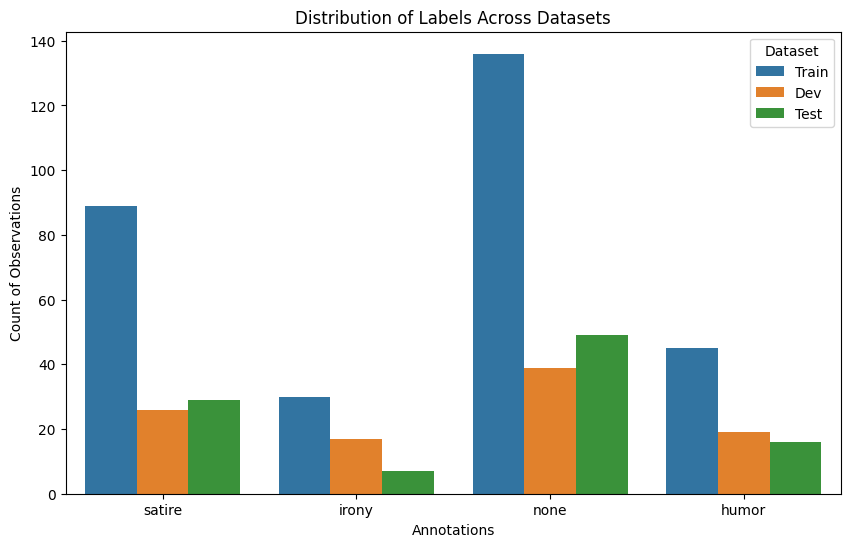

In [236]:
# Visualizing the distribution of the dataset labels
labels_dict = {0: 'humor', 1: 'irony', 2: 'none', 3: 'satire'}
df_train = pd.DataFrame({'Labels': train_y, 'Dataset': 'Train'})
df_dev = pd.DataFrame({'Labels': dev_y, 'Dataset': 'Dev'})
df_test = pd.DataFrame({'Labels': test_y, 'Dataset': 'Test'})
all_data = pd.concat([df_train, df_dev, df_test])

all_data['Labels'] = all_data['Labels'].map(labels_dict)

plt.figure(figsize=(10, 6))
sns.countplot(data=all_data, x='Labels', hue='Dataset')
plt.title('Distribution of Labels Across Datasets')
plt.xlabel('Annotations')
plt.ylabel('Count of Observations')
plt.legend(title='Dataset')
plt.xticks()
plt.show()


From the above distribution plots, it is clearly evident that there is a higher ratio of samples with the labels 'none' in the Train set as compared to the the other categories followed by 'satire' and then 'humor' followed by 'irony'. What this implies is that the distribution of classes is not balanced which could potentially result in a higher f-1 score for this class with irony having the least f-1 score value irrespective of whether we used ner preprocessing for the dataset or not.

To improve the BERT model performance, we leveraged NER tokenization prior to generating input_ids from the BERT Tokenizer and, as indicated above, the test accuracy slightly decreases from 0.594, 95% CIs: [0.498 0.690] to  0.554, 95% CIs: [0.458 0.651]

Beyond the accuracy metrics, and given the class imbalance, we then decided to consider the precision, recall, f1-score, and support (number of samples in test set) for each class which we have displayed below during both model training with and without ner tokenization:


In [237]:
import warnings
warnings.filterwarnings('ignore', category=UserWarning, module='sklearn')
## Classification Report on predictions without post processing
from sklearn.metrics import classification_report, accuracy_score
print(classification_report(test_y, y_preds, target_names=[labels_dict[i] for i in sorted(labels_dict.keys())]))

              precision    recall  f1-score   support

       humor       0.55      0.38      0.44        16
       irony       0.00      0.00      0.00         7
        none       0.65      0.84      0.73        49
      satire       0.50      0.45      0.47        29

    accuracy                           0.59       101
   macro avg       0.42      0.42      0.41       101
weighted avg       0.55      0.59      0.56       101



In [238]:
# Classification Report on predictions with ner post processing
from sklearn.metrics import classification_report, accuracy_score
print(classification_report(test_y, y_preds_post, target_names=[labels_dict[i] for i in sorted(labels_dict.keys())]))

              precision    recall  f1-score   support

       humor       0.75      0.56      0.64        16
       irony       0.25      0.14      0.18         7
        none       0.65      0.67      0.66        49
      satire       0.38      0.45      0.41        29

    accuracy                           0.55       101
   macro avg       0.51      0.46      0.47       101
weighted avg       0.56      0.55      0.55       101



The above reports show that generally, 'none' class has the highest f-1 score with 'irony' having the lowest f-1 score i.e., 0 implying that the model was not able to get any accurate prediction for the irony class without ner tokenization technique with some improvement with ner tokenization. With ner tokenization, we are able to observe a higher f-1 score for all the remaining classes thus implying that the representations learnt by the model in the former case are better than the previous case. To further deepen our understanding, we decided to visualize the attention outputs from the BERT transformer on the same test samples, to get a better sense of which tokens are being attended to the most, especially for the [CLS] token in the last layer (since the embeddings of this token are used for classification)

In [239]:
## visualizing attention via BertViz [uncomment the below two lines and run if running for the first time]
# !pip install bertviz
# !pip install ipywidgets
from bertviz import head_view, model_view

In [240]:
# Picking a misclassified point in the 'satire' category that ner tokenizer got correct:
print(f"Labels: {labels}")
label_number = labels['irony']

index = None  # Initialize to None to handle cases where no match is found
for i, (true, pred, post_pred) in enumerate(zip(test_y, y_preds, y_preds_post)):
    if true == post_pred and true != pred:
        index = i

batch_number = int(index/32)
data_sample = 91-(32*(batch_number))

example_token = test_batch_x[batch_number].input_ids[data_sample]
print(f"Input to the model without ner: {model.tokenizer.decode(example_token) }")

example_token_1 = test_batch_x_post[batch_number].input_ids[data_sample]
print(f"Input to the model with ner: {model_post.tokenizer.decode(example_token_1) }")

Labels: {'humor': 0, 'irony': 1, 'none': 2, 'satire': 3}
Input to the model without ner: [CLS] trump unveils exclusive double platinum–level press room for only select few journalists [SEP] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]
Input to the model with ner: [CLS] trump unveils exclusive double platinum–level press room for only select few journalists [SEP] [SEP] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]


The above output indicates that NER preprocessing is only adding an additional SEP token so it would be interesting to observe the attention going into this token to assess what role it might be playing in getting the prediction correct

In [135]:
# Visualizing attention based on a test_x input
# dissecting output layer attention

def prepare_for_bertviz(test_batch_x, outputs, batch_number=-1, data_sample=0):

  assert batch_number <= len(test_batch_x), f"test_batch_x has {len(test_batch_x)} batches"

  output_batch = outputs[batch_number]

  attentions = []
  for at in range(len(output_batch['attentions'])):
    to_append = output_batch['attentions'][at][data_sample,:,:,:]
    to_append = to_append.unsqueeze(0)
    attentions.append(to_append)


  inputs_ids = test_batch_x[batch_number].input_ids[data_sample,:]
  tokens = model.tokenizer.convert_ids_to_tokens(inputs_ids)
  return tokens, attentions

# model_view(attentions, tokens)

In [241]:
tokens, attentions = prepare_for_bertviz(test_batch_x,outputs,batch_number,data_sample)

In [242]:
head_view(attentions, tokens)

<IPython.core.display.Javascript object>

In [251]:
#model_view(attentions, tokens)

In [248]:
# Doing the same analysis for ner tokenization
tokens, attentions = prepare_for_bertviz(test_batch_x_post,outputs_post,batch_number,data_sample)

In [249]:
head_view(attentions, tokens)

<IPython.core.display.Javascript object>

In [252]:
# model_view(attentions, tokens)

Concluding Remarks:
The above attentions heads, primarily for layer 11 (the final layer) give us meaningful insights onto our analysis. Primarily, we can see that the [CLS] token (hover over it) with the NER processing attends to more tokens with emphasis on tokens like exclusive, rump, journalists, and ils whereas without ner tokenization, it attends more to 'rump' which might be the cause for the incorrect prediction since trump sentences were majority satire hence, resulting in potentially incorrect predicition

Note: While bertviz also shows the PAD tokens, it should be noted that they are ignored by the model by default.

#### Feel free to uncomment and run the model_view() command above to gain a deeper understanding of how the attentions weights are being updated for the whole model
